In [2]:
import cv2
import os
import shutil
import colorsys
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import deque
from glob import glob

In [3]:
def findLimits(frame):
    ''' Let's find the red objects in the scene ''' 
    hsv_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    h,_,_ = cv2.split(hsv_frame)
    lower_red = np.array([0,150,150])
    upper_red = np.array([20,255,255])
    red = cv2.inRange(hsv_frame, lower_red, upper_red)
    red = cv2.bitwise_not(red)
    
    # Finding the possition of the two red marks in the scene
    keypoints = detector2.detect(red)
    marks = []
    copied_im = cv2.cvtColor(red.copy(), cv2.COLOR_GRAY2BGR)
    for k in keypoints:
        x, y = k.pt
        marks.append((int(x), int(y)))
    return marks

def isEmpty(scene):
    ''' Checks if in the current frame there is someone using the histogram of a blank laboratory '''
    hsv_scene = cv2.cvtColor(scene,cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(hsv_scene)
    H_array = H[S > 100].flatten()
    val, pos = np.histogram(H_array, 18)
    val[[0,3]] = 0
#     print(val[[4,5,7,8,12,13,14,15,16]].max())
    return val.max()<1000

def create_dir(folder, force=True, verbose=False):
    '''   Create a directory if it doesn't exist  '''
    try:
        os.makedirs(folder)
        if verbose: print('Directory {} created succesfully.'.format(folder))   
    except:
        if force:
            if verbose: print('{} already exists. Creating a new one'.format(folder))
            shutil.rmtree(folder)
            os.makedirs(folder)
        else:
            if verbose: print('{} already exists.'.format(folder))
            pass

def bkgrd_hsv_substraction(frgrd, bkgrd):
    ''' Performs background substraction using the HLS color space '''
    bkgrd_hsv = cv2.cvtColor(bkgrd, cv2.COLOR_BGR2HLS)
    frgrd_hsv = cv2.cvtColor(frgrd, cv2.COLOR_BGR2HLS)

    diff = cv2.subtract(bkgrd_hsv, frgrd_hsv)
    diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, raw = cv2.threshold(diff_gray, 15, 255, cv2.THRESH_BINARY)
    if diff_gray.sum()> 400000:
        closed = fine_mask(raw)
        blured = cv2.GaussianBlur(closed,(3,3),0)
        return True, raw, closed, blured
    else:
        return False, None, None, None

def isBackground(frgnd, bkgnd, th=1):
    bkgrd_hsv = cv2.cvtColor(bkgnd, cv2.COLOR_BGR2Lab)
    frgrd_hsv = cv2.cvtColor(frgnd, cv2.COLOR_BGR2Lab)

    diff = cv2.subtract(bkgrd_hsv, frgrd_hsv)
    diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    return diff.sum() / 1000000

def com_his(frame, background, th=5):
    hsv_scene = cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(hsv_scene)
    H_array = H[S > 100].flatten()
    val1, pos = np.histogram(H_array, 18)
#     print(val1)

    hsv_scene = cv2.cvtColor(background,cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(hsv_scene)
    H_array = H[S > 100].flatten()
    val2, pos = np.histogram(H_array, 18)
#     print(val2)
    return np.linalg.norm(val2 - val1) //1000 > th

kernel = np.ones((5,5),np.uint8)
def bkgrd_Lab_substraction(frame, background, th=5):
    ''' Performs background substraction using the Lab color space, which helps to reduce light noise '''
    bkgrd_h = (cv2.cvtColor(background, cv2.COLOR_BGR2Lab))
    frgrd_h = (cv2.cvtColor(frame, cv2.COLOR_BGR2Lab))

    diff = cv2.subtract(bkgrd_h, frgrd_h)
    diff = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, diff = cv2.threshold(diff, 5, 255, cv2.THRESH_BINARY)
    diff = cv2.morphologyEx(diff, cv2.MORPH_CLOSE, kernel)
    if diff.sum() / 1000000 > th:
        closed = fine_mask(diff)
        blured = cv2.GaussianBlur(closed,(3,3),0)
        closed = cv2.multiply(diff, closed)
        return True, diff, closed, blured
    else:
        return False, None, None, None
    
def fine_mask(mask):
    ''' Takes a raw mask as input and returns the biggest contour mask '''
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    c = max(contours, key = cv2.contourArea)
    out = np.zeros_like(mask)
    out = cv2.drawContours(out, [c], 0, 255, -1)
    return out


def random_colors(N, bright=True):
    ''' Generate random colors  '''
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    # random.shuffle(colors)
    return colors

color = random_colors(1)[0]

def apply_mask(frame, mask, color, alpha=0.5):
    ''' Apply the given mask to the image '''
    image = frame.copy()
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image

In [28]:
clips_directory = '/home/christian/Documents/Datasets/clips/'
raw_directory = '/home/christian/Documents/Datasets/OAKGait20/'
#subjects = sorted(os.listdir(os.path.join(raw_directory, '090')))
subjects = ['000', '010', '011', '012', '013', '014', '015', '016', '017']

In [29]:
views = ['060','075','090','105','120',]
walks = {'nm':'nm.mp4', 'bg':'bg.mp4', 'cl':'cl.mp4'}

# walks = {'cl':'cl.mp4'}
# walks = {'nm':'nm.mp4'}
# walks = {'bg':'bg.mp4'}

In [30]:
subject_new = False   # Creates a new directory for each subject [001, ... , ]
walk_new = True       # Creates a new directory for each walking [nm, bg, cl]
empty_frame = 90    # True if the first frame is background
already_background = False
for view in views:
    print(f'PROCESSING VIEW: {view}')
#     for subject in ['006', '007']:
    for subject in subjects:
        for walk, file in walks.items():
            print(f'Processing subject:{subject} walking: {walk} view: {view}')
            video_path = os.path.join(raw_directory, view, subject, file)
            cap = cv2.VideoCapture(video_path)
#             wait = int(1000 / cap.get(cv2.CAP_PROP_FPS))

            sub_dir = os.path.join(clips_directory, view, str(subject).zfill(3))
            create_dir(sub_dir, force=subject_new)

            clip_dir = os.path.join(clips_directory, view, str(subject).zfill(3), walk)
            create_dir(clip_dir, force=walk_new)

            # Identify the background of each sequence using the 'isEmpty()' function
            cnt = 0
            background = None

            while True:
                ret, first = cap.read()
                if ret:
                    if cnt == empty_frame:
                        background = first
                        break
                    cnt+=1
                else:
                    print('Not background found')
                    break
            # Saving the background image
            back_name = os.path.join(clip_dir, f'background.png')
            cv2.imwrite(back_name, background)

            # Defining parameters to split each video
            cap.set(cv2.CAP_PROP_POS_FRAMES, 90)
            cnt = 0
            nwalking = 1
            isWalking = False
            x = deque(12*[True],12)

            # Getting parameters for the video clips
            codec = cv2.VideoWriter_fourcc('M','J','P','G')
            fwidth = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
            fheight = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
            fps = int(cap.get(cv2.CAP_PROP_FPS))

            while True:
                ret, scene = cap.read()
                if ret:
                    if cnt%3 == 0:
                        diff,_,_,_ = bkgrd_Lab_substraction(scene, background, th=30)
#                         diff = com_his(scene, background, th=15)
#                         cv2.putText(scene, str(diff), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, 255)

                        x.appendleft(not diff) 
                        #print(np.average(x))
#                         if np.mean(np.array([x[1], x[2], x[3], x[4], x[5], x[6]])) > 0.8:
                        if np.average(x)>0.5:
                            if isWalking:
                                print(f'|')
                                isWalking = False
                                out.release()
                        elif not isWalking:
                            print(f'Sequence {nwalking}', end='')
                            isWalking = True
                            clip_name = os.path.join(clip_dir, f'{walk}-{str(nwalking).zfill(2)}.avi')
                            out = cv2.VideoWriter(clip_name, codec, fps, (fwidth,fheight))
                            nwalking +=1
                    if isWalking:
                        out.write(scene)
                        if cnt%10==0: print('.', end='')
                    cnt+=1         
                    
                    #cv2.imshow(f'Subject {subject}', cv2.resize(scene, (300,300)))
                else:
                    break
                if cv2.waitKey(1) == ord('q'):
                    break
            out.release()
            cap.release()
            cv2.destroyAllWindows()

PROCESSING VIEW: 060
Processing subject:000 walking: nm view: 060
Sequence 1...............|
Sequence 2...............|
Sequence 3..............|
Sequence 4...............|
Sequence 5..............|
Sequence 6..............|
Sequence 7...............|
Sequence 8..............|
Processing subject:000 walking: bg view: 060
Sequence 1.............|
Sequence 2.............|
Sequence 3.............|
Sequence 4.............|
Sequence 5............|
Sequence 6.............|
Sequence 7..............|
Sequence 8..............|
Processing subject:000 walking: cl view: 060
Sequence 1..............|
Sequence 2.............|
Sequence 3..............|
Sequence 4......................|
Sequence 5|
Sequence 6.........................|
Sequence 7..............|
Sequence 8..............|
Sequence 9..............|
Processing subject:010 walking: nm view: 060
Sequence 1...............................|
Sequence 2.................|
Sequence 3...................|
Sequence 4..................|
Sequence 5.....

FileNotFoundError: [Errno 2] No such file or directory: '/home/christian/Documents/Datasets/clips/075/010/cl'


(python:8001): GStreamer-CRITICAL **: 10:51:51.118: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@97.981] global ../opencv/modules/videoio/src/cap_gstreamer.cpp (1127) open OpenCV | GStreamer warning: Error opening bin: no source element for URI "/home/christian/OAKGait8/color/090/000/nm.mp4"
[ WARN:0@97.981] global ../opencv/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created


NameError: name 'background' is not defined

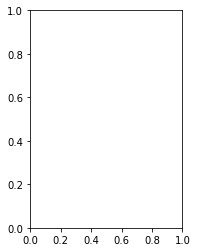

In [6]:
cap = cv2.VideoCapture('/home/christian/OAKGait8/color/090/000/nm.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES, 100)
ret, frame = cap.read()
plt.subplot(121); plt.imshow(background[:,:,::-1])
plt.subplot(122); plt.imshow(frame[:,:,::-1])

In [6]:
images_dir = '/home/christian/Documents/Datasets/OAKGait8/frames/'
frs_dir = 'rgb_unet/'
verbose = True
subjects = ['000','001', '002', '003', '004', '005', '006', '007']
nclips = {'nm':6, 'bg':6, 'cl':6}

In [5]:
views = ['060', '075', '090', '105', '120']
#views = ['105', '120']
for view in views:
    frames_dir = os.path.join(images_dir, view, frs_dir)
    print(f'PROCESSING VIEW: {view}')
    subjects = sorted(os.listdir(os.path.join(clips_directory, view)))
    for subject in subjects:
#     for subject in ['004']:
        print(f'Processing subject: {subject} view: {view}....                                  ')
        create_dir(os.path.join(frames_dir, subject), force=True)
        subject_dir = os.path.join(clips_directory, view, subject)
        walks = os.listdir(subject_dir)
        
        for j, walk in enumerate(['nm', 'bg', 'cl']):
#         for j, walk in enumerate(['nm']):

            walk_dir = os.path.join(subject_dir, walk)
            clips = sorted(os.listdir(walk_dir))
            
            for i, clip in enumerate(clips):
                if clip[-4:] == '.avi' and nclips[walk]>=i:
                    clip_path = os.path.join(walk_dir, clip)
                    sub_dir = os.path.join(frames_dir, subject, walk, clip.split('.')[0])
                    
                    create_dir(sub_dir, force=True)
                    print(sub_dir, end='\r')
                    cap = cv2.VideoCapture(clip_path)
                    cnt = 0
                    while True:
                        ret, frame = cap.read()
                        if ret:
                            cnt +=1
                            frame_path = f'{sub_dir}/{str(cnt).zfill(4)}.png'
                            frame = cv2.resize(frame, (0,0), fx=0.5, fy=0.5)
                            cv2.imwrite(frame_path, frame)
                        else:
                            break
                        if cv2.waitKey(1) == ord('q'):
                            break
                    cap.release()
    print('', end="\r")
cv2.destroyAllWindows()

PROCESSING VIEW: 060
Processing subject: 000 view: 060....                                  
Processing subject: 001 view: 060....                                  cl-01
Processing subject: 002 view: 060....                                  cl-06
Processing subject: 003 view: 060....                                  cl-06
Processing subject: 004 view: 060....                                  cl-06
Processing subject: 005 view: 060....                                  cl-06
Processing subject: 006 view: 060....                                  cl-06
Processing subject: 007 view: 060....                                  cl-06
PROCESSING VIEW: 075ments/Datasets/OAKGait8/frames/060/rgb_unet/007/cl/cl-06
Processing subject: 000 view: 075....                                  
Processing subject: 001 view: 075....                                  cl-06
Processing subject: 002 view: 075....                                  cl-06
Processing subject: 003 view: 075....                            

[mjpeg @ 0x5566c8e3bc40] overread 8


Processing subject: 003 view: 105....                                  cl-06
Processing subject: 004 view: 105....                                  cl-06
Processing subject: 005 view: 105....                                  cl-06
Processing subject: 006 view: 105....                                  cl-06
Processing subject: 007 view: 105....                                  cl-06
PROCESSING VIEW: 120ments/Datasets/OAKGait8/frames/105/rgb_unet/007/cl/cl-06
Processing subject: 000 view: 120....                                  
Processing subject: 001 view: 120....                                  cl-06
Processing subject: 002 view: 120....                                  cl-06
Processing subject: 003 view: 120....                                  cl-06
Processing subject: 004 view: 120....                                  cl-06
Processing subject: 005 view: 120....                                  cl-06
Processing subject: 006 view: 120....                                  cl-06
Proc

SHOWING VIEW: 060
Showing subject: 000 view: 060


[ WARN:0@5393.995] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/060/rgb_unet/000/nm/nm-02/0040.png'): can't open/read file: check file path/integrity


Error opening
Error opening


[ WARN:0@5397.753] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/060/rgb_unet/000/cl/cl-01/0040.png'): can't open/read file: check file path/integrity


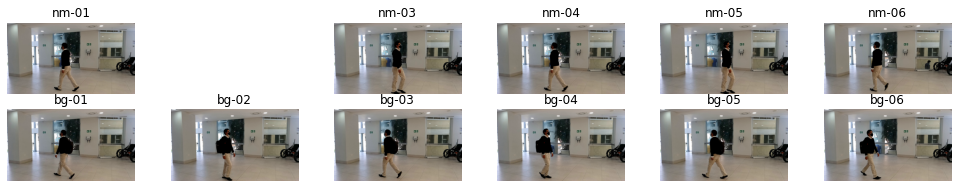

Showing subject: 001 view: 060


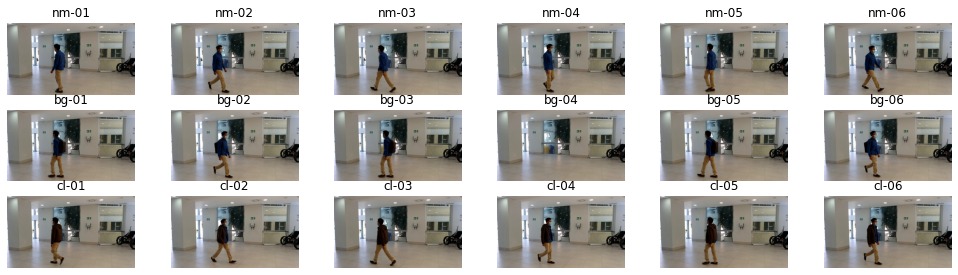

Showing subject: 002 view: 060


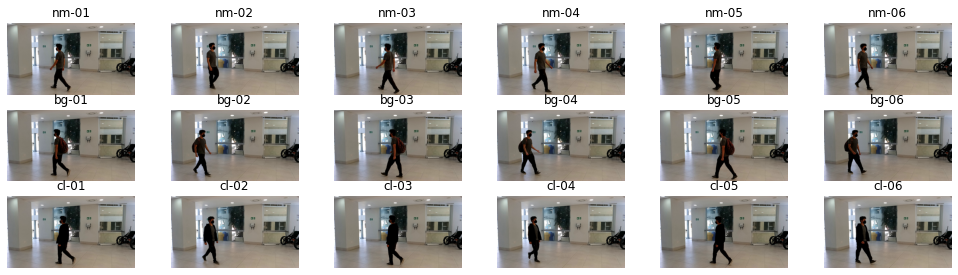

Showing subject: 003 view: 060


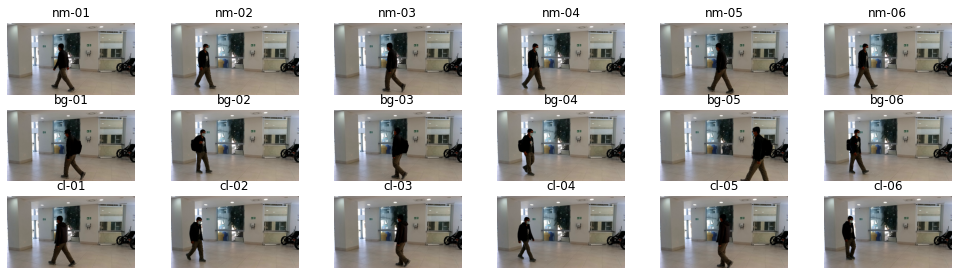

Showing subject: 004 view: 060


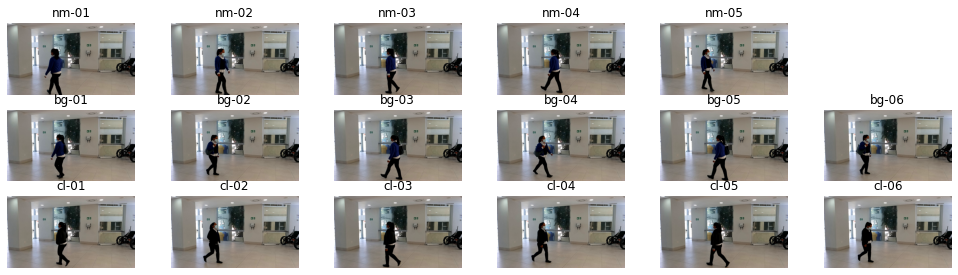

Showing subject: 005 view: 060


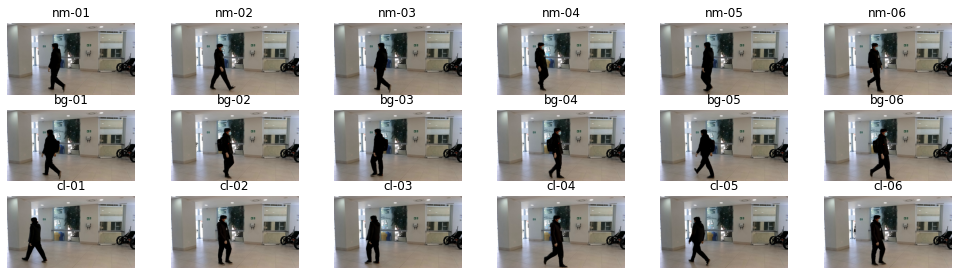

Showing subject: 006 view: 060
Error opening
Error opening
Error opening
Error opening
Error opening


[ WARN:0@5419.056] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/060/rgb_unet/006/nm/nm-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5419.056] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/060/rgb_unet/006/nm/nm-02/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5419.057] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/060/rgb_unet/006/nm/nm-03/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5419.057] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/060/rgb_unet/006/nm/nm-04/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5419.231] global ../opencv/modules/imgcodecs/src/lo

Error opening
Error opening


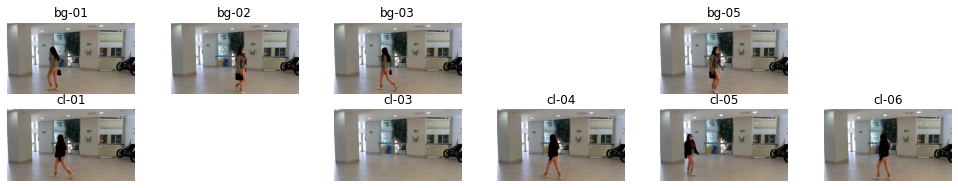

Showing subject: 007 view: 060


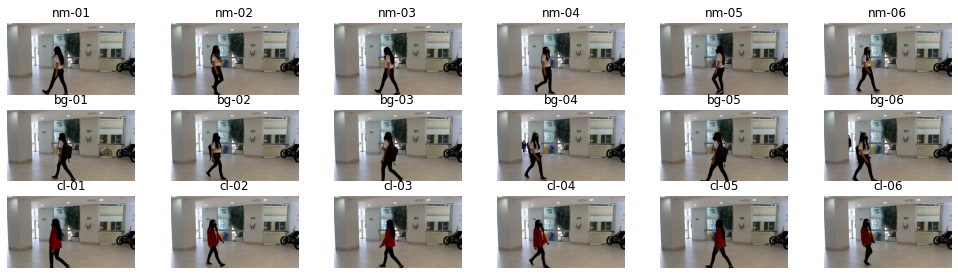

SHOWING VIEW: 075
Showing subject: 000 view: 075


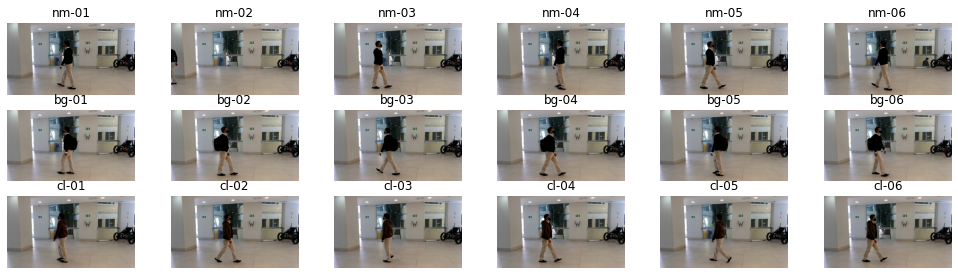

Showing subject: 001 view: 075


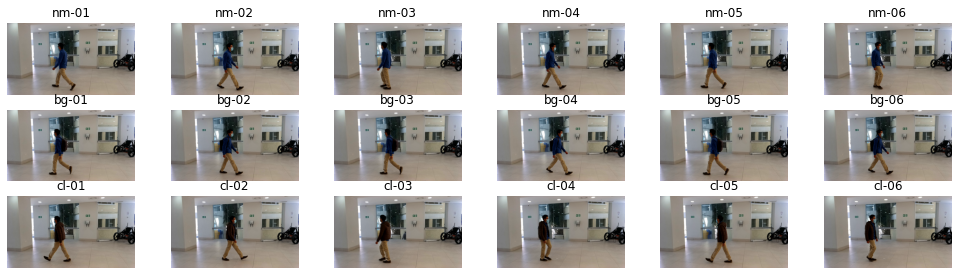

Showing subject: 002 view: 075


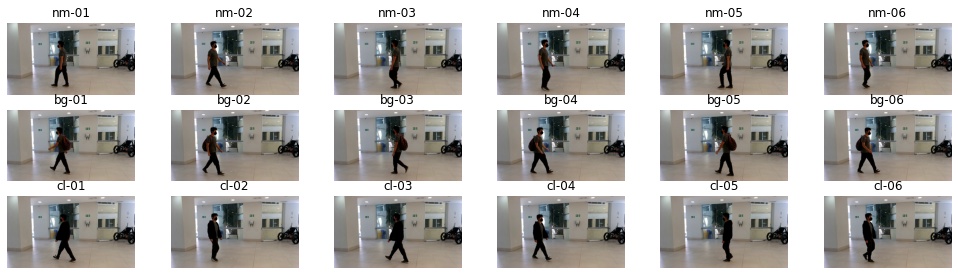

Showing subject: 003 view: 075


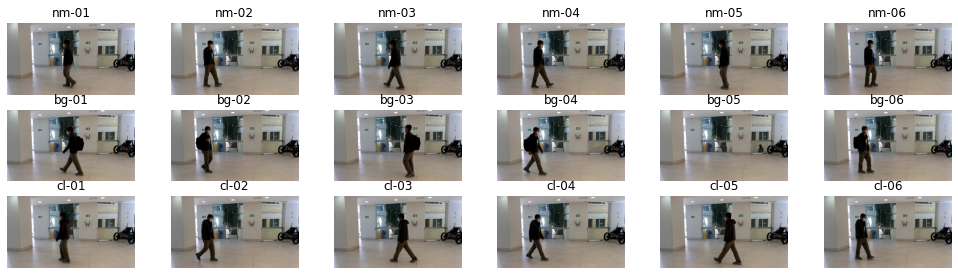

Showing subject: 004 view: 075


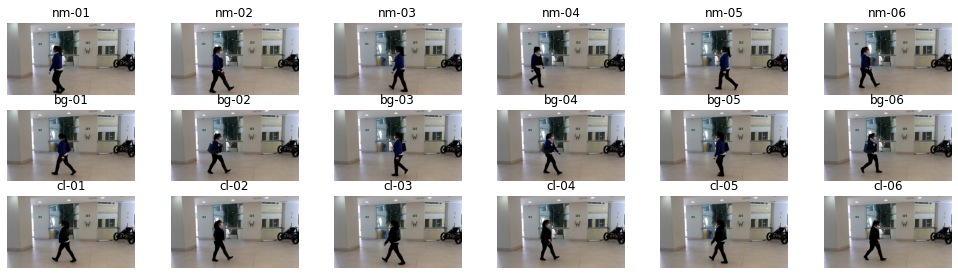

Showing subject: 005 view: 075


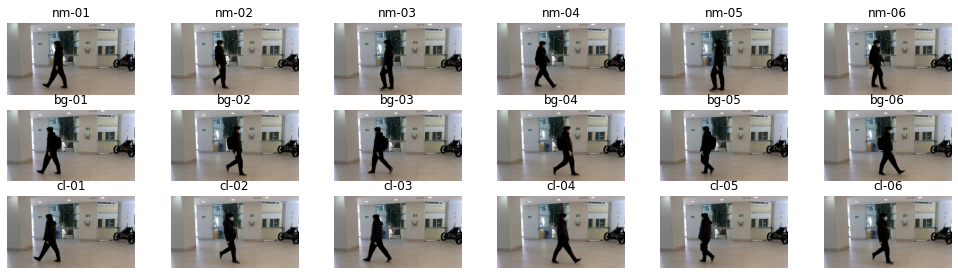

Showing subject: 006 view: 075
Error opening


[ WARN:0@5445.317] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/075/rgb_unet/006/nm/nm-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5445.575] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/075/rgb_unet/006/bg/bg-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5445.576] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/075/rgb_unet/006/bg/bg-02/0040.png'): can't open/read file: check file path/integrity


Error opening
Error opening


[ WARN:0@5445.941] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/075/rgb_unet/006/bg/bg-05/0040.png'): can't open/read file: check file path/integrity


Error opening


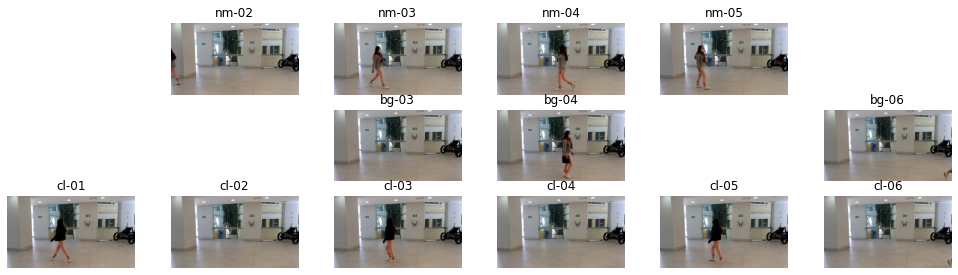

Showing subject: 007 view: 075


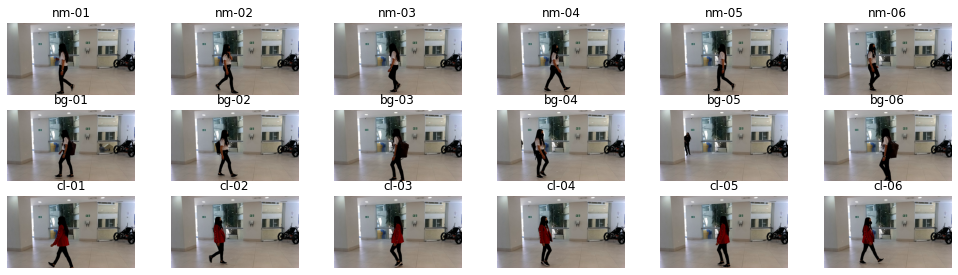

SHOWING VIEW: 090
Showing subject: 000 view: 090
Error opening


[ WARN:0@5451.312] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/090/rgb_unet/000/nm/nm-01/0040.png'): can't open/read file: check file path/integrity


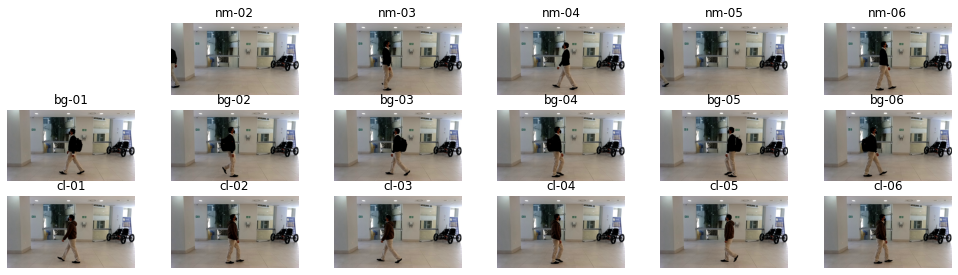

Showing subject: 001 view: 090


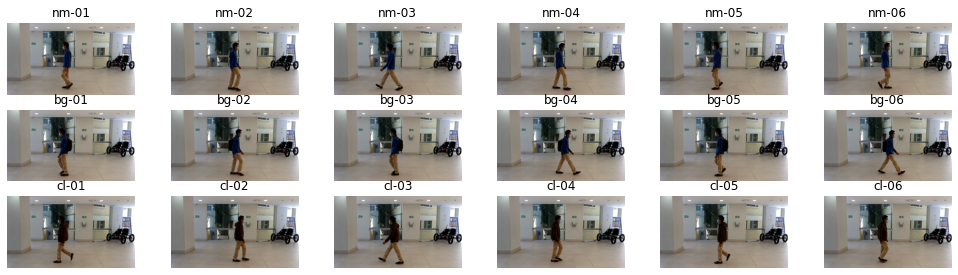

Showing subject: 002 view: 090


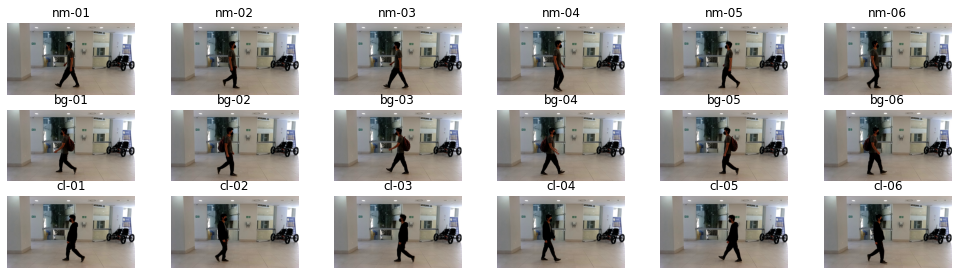

Showing subject: 003 view: 090


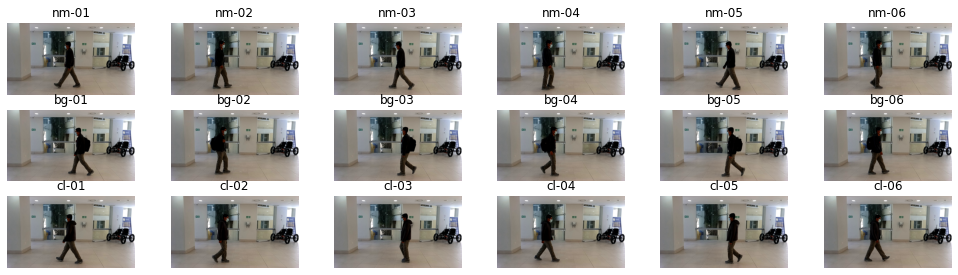

Showing subject: 004 view: 090


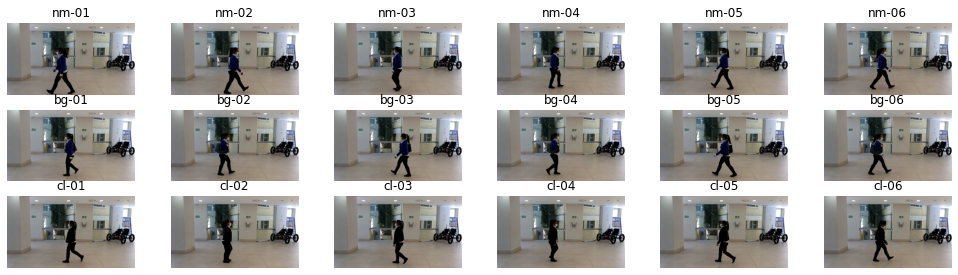

Showing subject: 005 view: 090


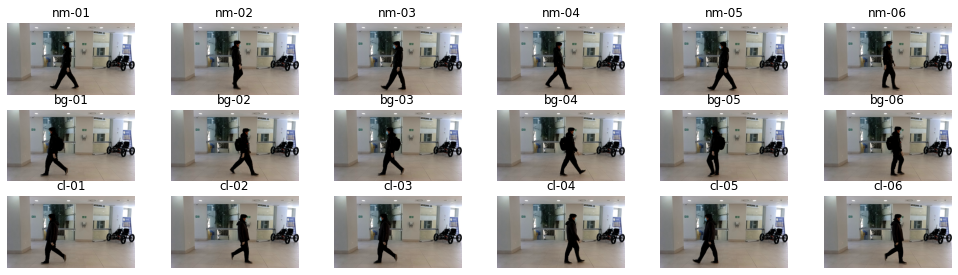

Showing subject: 006 view: 090
Error opening
Error opening
Error opening
Error opening
Error opening


[ WARN:0@5473.584] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/090/rgb_unet/006/bg/bg-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5473.763] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/090/rgb_unet/006/bg/bg-03/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5473.764] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/090/rgb_unet/006/bg/bg-04/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5473.764] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/090/rgb_unet/006/cl/cl-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5473.764] global ../opencv/modules/imgcodecs/src/lo

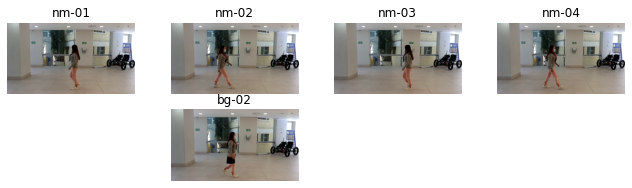

Showing subject: 007 view: 090


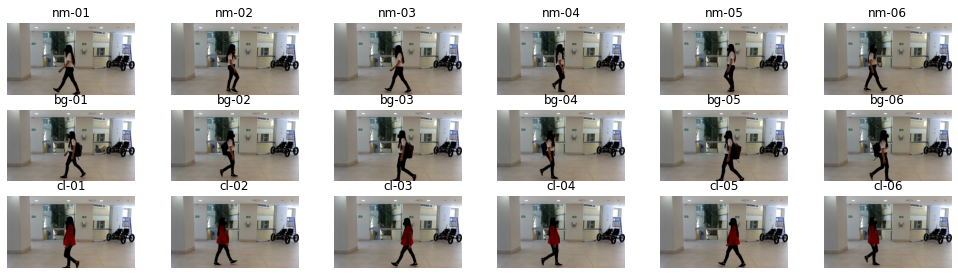

SHOWING VIEW: 105
Showing subject: 000 view: 105


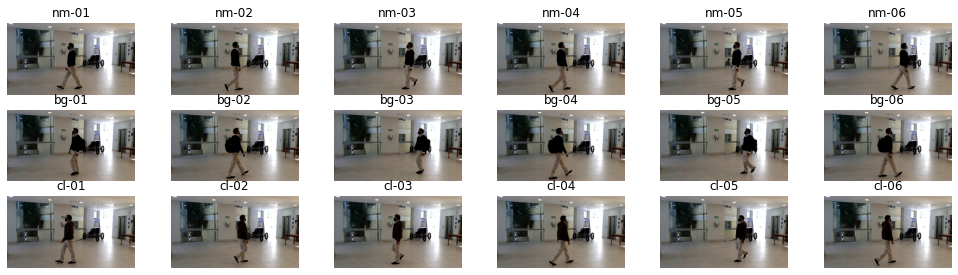

Showing subject: 001 view: 105


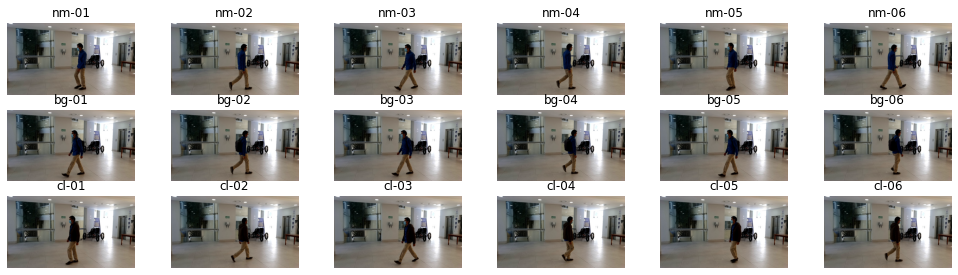

Showing subject: 002 view: 105


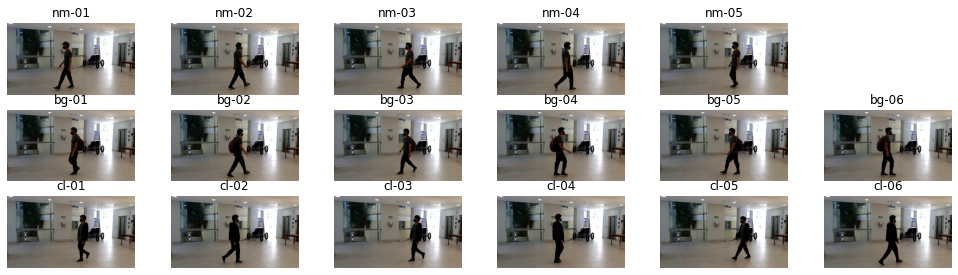

Showing subject: 003 view: 105


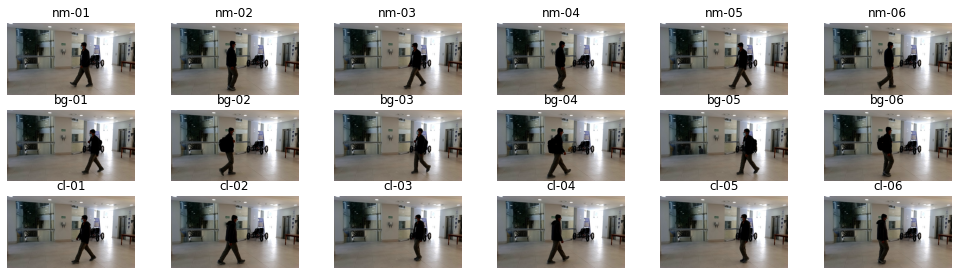

Showing subject: 004 view: 105


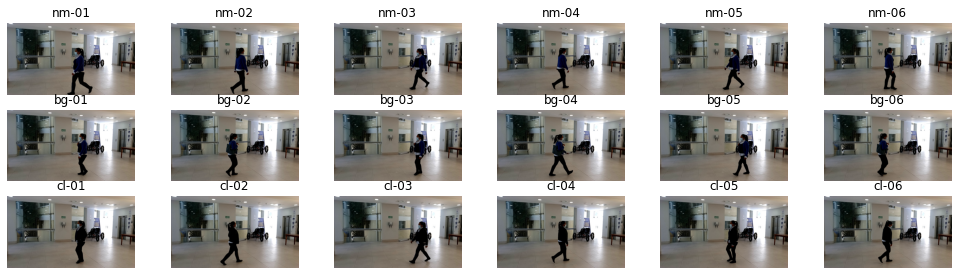

Showing subject: 005 view: 105


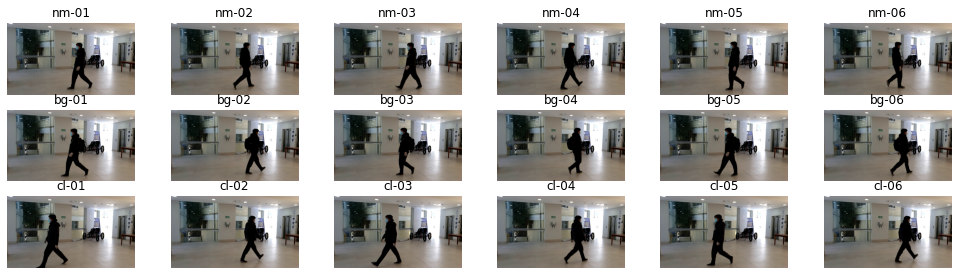

Showing subject: 006 view: 105
Error opening
Error opening
Error opening


[ WARN:0@5499.501] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/105/rgb_unet/006/nm/nm-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5499.504] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/105/rgb_unet/006/nm/nm-02/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5499.504] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/105/rgb_unet/006/nm/nm-03/0040.png'): can't open/read file: check file path/integrity


Error opening
Error opening
Error opening


[ WARN:0@5499.748] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/105/rgb_unet/006/bg/bg-01/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5499.752] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/105/rgb_unet/006/bg/bg-02/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5499.848] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/105/rgb_unet/006/bg/bg-04/0040.png'): can't open/read file: check file path/integrity


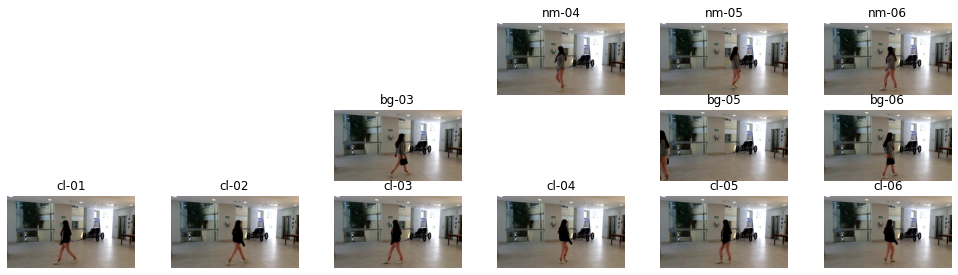

Showing subject: 007 view: 105


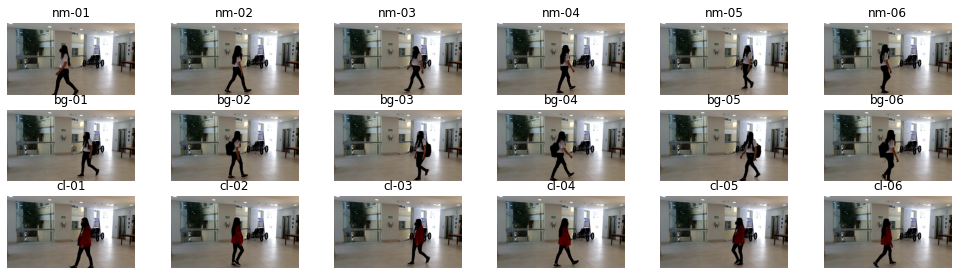

SHOWING VIEW: 120
Showing subject: 000 view: 120


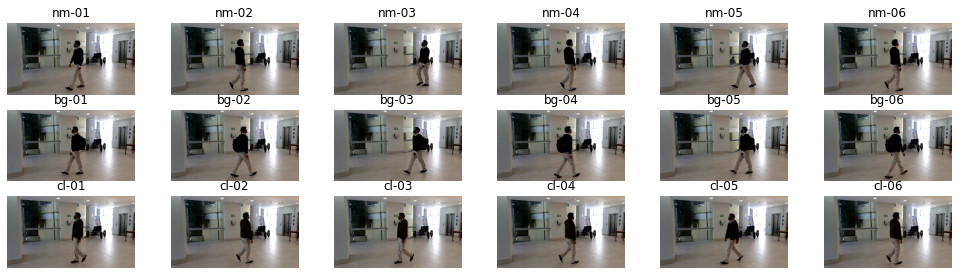

Showing subject: 001 view: 120


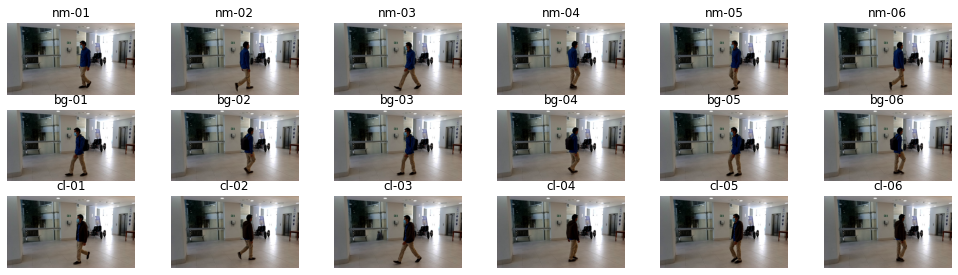

Showing subject: 002 view: 120


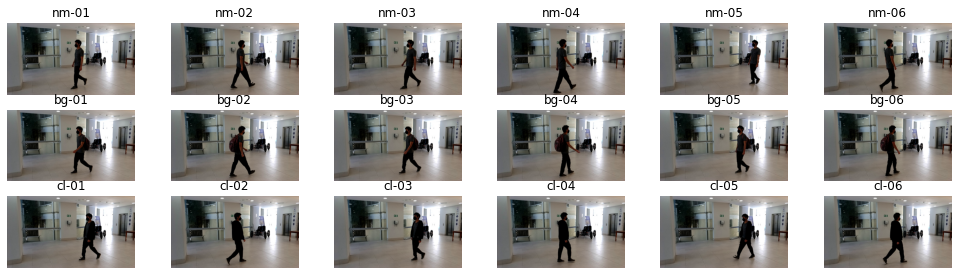

Showing subject: 003 view: 120


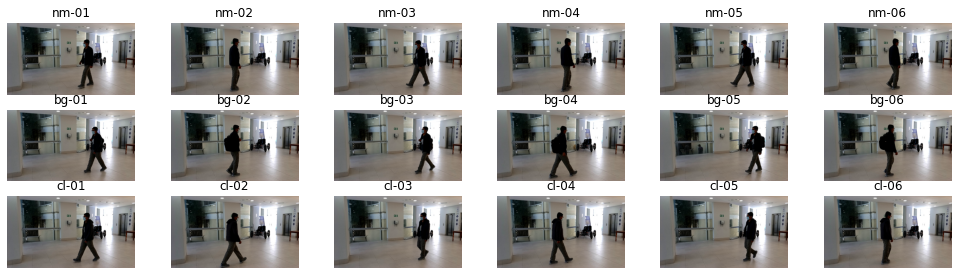

Showing subject: 004 view: 120


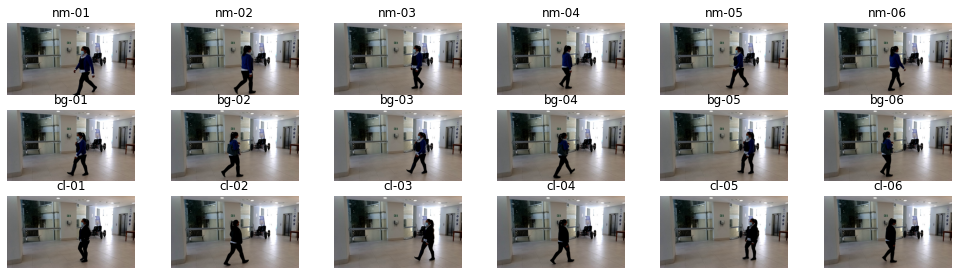

Showing subject: 005 view: 120


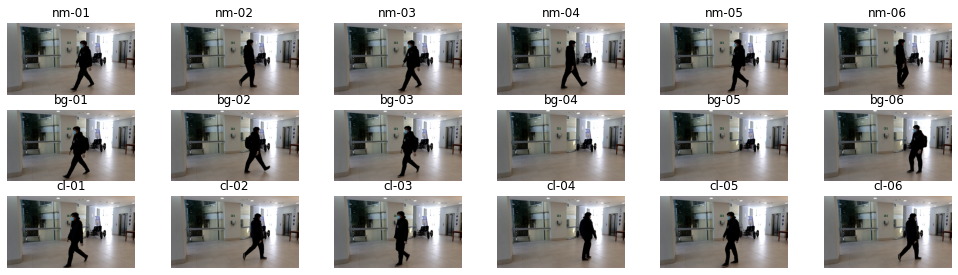

Showing subject: 006 view: 120
Error opening


[ WARN:0@5530.706] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/120/rgb_unet/006/nm/nm-03/0040.png'): can't open/read file: check file path/integrity
[ WARN:0@5530.850] global ../opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/christian/Documents/Datasets/OAKGait8/frames/120/rgb_unet/006/bg/bg-01/0040.png'): can't open/read file: check file path/integrity


Error opening


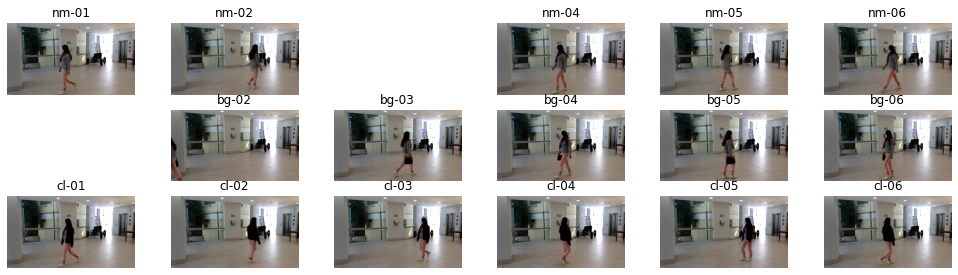

Showing subject: 007 view: 120
